# Computer Vision - P4

### **Carefully read the file `README.md` as well as the following instructions before start coding.**

## Delivery

Up to **1 point out of 10** will be penalized if the following requirements are not fulfilled:

- Implemented code should be commented.

- The questions introduced in the exercises must be answered.

- Add title to the figures to explain what is displayed.

- Comments and answers need to be in **English**.

- The deliverable must be a file named **P4_Student1_Student2.zip** that includes:
    - The notebook P4_Student1_Student2.ipynb completed with the solutions to the exercises and their corresponding comments.

**Deadline (Campus Virtual): November 22th, 23:00 h** 

==============================================================================================
## Descriptors extraction for object detection, based on template matching, ORB, and HOG
==============================================================================================

The main topics of Laboratory 4 are:

    4.1) SSD and Normalized Cross-correlation for template matching

    4.2) HOG image descriptor for object (person) detection

    4.3) Recognition by correspondance, based on feature extraction (ORB)

In order to complete this practicum, the following concepts need to be understood: template matching, feature localization (Harris, Censure), feature descriptor (HOG,ORB, Sift) methods.

It is highly recommendable to structure the code in functions in order to reuse code for different tests and images and make it shorter and more readable. Specially the visualization commands should be encapsulated in separate functions.

In [32]:
%matplotlib inline

import numpy as np # useful for manipulating matrices
from skimage import io # useful for image loading and saving
from matplotlib import pyplot as plt # useful for plotting images on iPython or Jupyter Notebooks
import warnings

from numpy import linalg as LA
from skimage.feature import match_template
from skimage.color import rgba2rgb
from skimage.color import rgb2gray 
from skimage.util import img_as_ubyte 
from skimage.util import img_as_float 
from skimage.util import img_as_uint
from skimage.transform import rotate


from skimage.feature import hog
from skimage import data, exposure
import matplotlib.patches as patches

from skimage.feature import CENSURE
from skimage.feature import match_descriptors, ORB, plot_matches 
from skimage import transform as tf 

warnings.simplefilter('ignore')

In [2]:
def show_img(image,title):
    """
    function that displays a single image with its corresponding title
        image: image we want to display
        title: title of the image we want to display
    """
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()

In [3]:
def show_row_of_images(images,titles):
    """
    function that displays a row of images
        images: list of images
        titles: list of image titles
    """
    canvas, axs = plt.subplots(nrows=1, ncols=len(images), figsize=(20,20))
    
    for index,image in enumerate(images):
        ax = axs[index]
        ax.imshow(image, cmap='gray')
        ax.axis('off')
        ax.set_title(titles[index])

In [4]:
def show_images(images,titles,ncols):
    """
    function that displays a set of images
        images: list of images
        titles: list of image titles
        ncols: number of columns
    """
    nrows = len(images)//ncols
    
    if nrows == 1:
        show_row_of_images(images,titles)
    
    elif ncols == 1:
        for i in range(len(images)):
            show_img(images[i],titles[i])
    else:
        fig, axs = plt.subplots(nrows=nrows, ncols=ncols,figsize=(15,15))

        index = 0
        for i in range(nrows):
            for j in range(ncols):
                ax = axs[i,j]
                ax.imshow(images[index],cmap='gray')
                ax.set_title(titles[index])
                ax.axis('off')
                index += 1

        plt.show()

In [5]:
def show_detail(image):
    """
    function that displays the details of an image
    """
    print('Shape:',image.shape)
    print('Data type:',image.dtype)
    print('Max:',image.max())
    print('Min:', image.min())
    print('Size:',image.size)

In [6]:
def show_details(images,titles = None):
    """
    function that displays the details of a list of images
    """
    for index,image in enumerate(images):
        print('\nDetails of ',titles[index])
        show_detail(image)

In [7]:
def show_details_of_images(images):
    """
    auxiliar function that shows us the details of a list of images
        images: the list of image we want to see details
    """
    for i in range(len(images)):
        show_details(images[i])
        print()

## 1 Template matching

**1.1** Given the image 'einstein.png' and the template image 'eye.png', detect the location of the template in the image comparing the use of:
- SSD distance (hint: norm() in numpy.linalg).
- normalized cross-correlation (hint: match_template() of skimage.feature).

Don't forget to normalize the images (having pixel values between [0,1]) before comparing them.


Details of  einstein
Shape: (762, 595)
Data type: float64
Max: 1.0
Min: 0.0
Size: 453390

Details of  eye
Shape: (46, 46)
Data type: float64
Max: 0.9607843137254902
Min: 0.0
Size: 2116


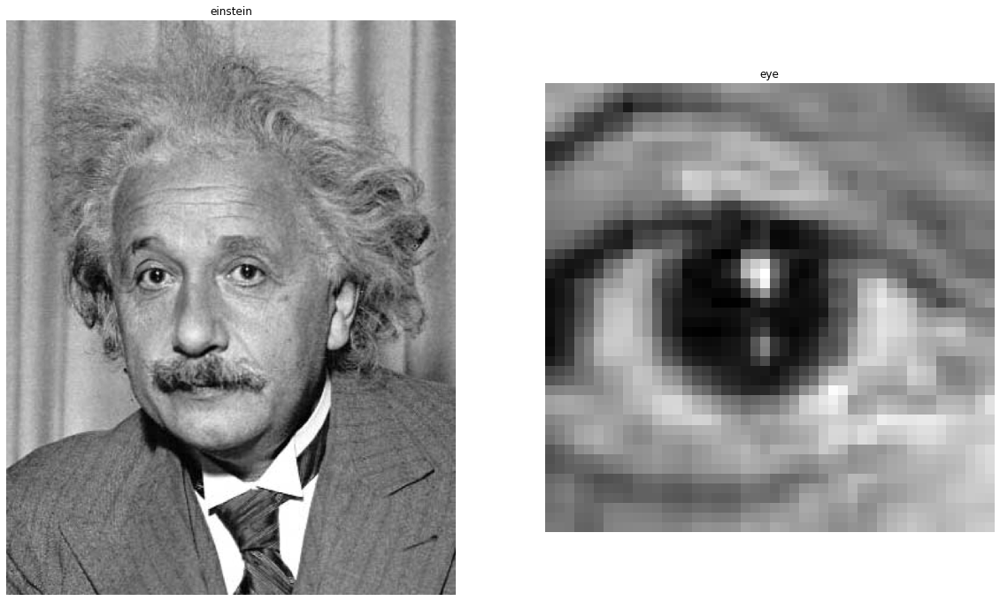

In [8]:
eins = io.imread('images/einstein.png')
ey = io.imread('images/eye.png')

# preprocessing
einstein = rgb2gray(rgba2rgb(eins))
eye = rgb2gray(rgba2rgb(ey))
einstein,eye = img_as_float(einstein), img_as_float(eye)

# plot
images = [einstein,eye]
titles = ['einstein','eye']
show_row_of_images(images,titles)
show_details(images,titles)

In [9]:
def ssd_distance(einstein,eye):
    width = einstein.shape[0]-eye.shape[0]
    height = einstein.shape[1]-eye.shape[1]
    match = np.zeros((width,height))
    
    for i in range(width):
        for j in range(height):
            # compute ssd distance between einstein and eye
            match[i,j] = np.linalg.norm(einstein[i:i+eye.shape[0], j:j+eye.shape[1]] - eye)
    
    return match

In [10]:
def cross_correlation(einstein,eye):
    result = match_template(einstein, eye)
    return result

In [11]:
ssd_dis = ssd_distance(einstein,eye)
cross_corr = cross_correlation(einstein,eye)

Create a function for template matching applying SSD distance and normalized cross-correlation and display the results in the following format:
    
<img src="images_notebook/tm.png" width="400" height="120">

**Use titles in all figures to understand what is being displayed.**

In [12]:
def template_matching(original,template,threshold_ssd = 8.3, threshold_cross = 0.53):
    """
    function that display images applied SSD distance and normalized cross corrleation 
        original: original image 
        template: template image
    """
    ssd_dis = ssd_distance(original,template)
    cross_corr = cross_correlation(original,template)
    threshold_ssd = ssd_dis < threshold_ssd
    threshold_cross = cross_corr > threshold_cross
    images = [original,ssd_dis,threshold_ssd,template,cross_corr,threshold_cross]
    titles = ['original','ssd_distance','threshold ssd','template','cross correlation','threshold cross correlation']
    # plot all figures
    show_images(images,titles,3)
    return ssd_dis,cross_corr

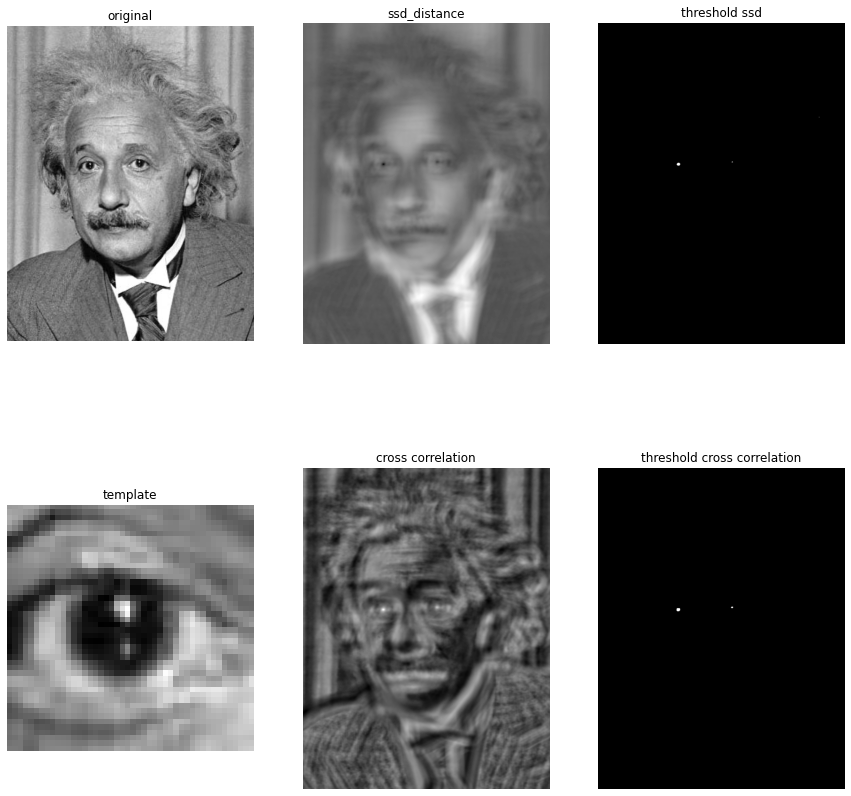

In [13]:
ssd,cross = template_matching(einstein,eye)

**1.2** How does the result of the template matching change if the image changes its contrast (for example if you make it clearer or darker)? 

Similarly to the previous case, please, visualize the euclidean distance and normalized cross-correlation images as well as the binarized (thresholded) images in the two cases.

**Note:** Use titles of the figures to explain what is displayed.


Read `einstein_br.png` and display the results on this image, using `eye.png` as template:

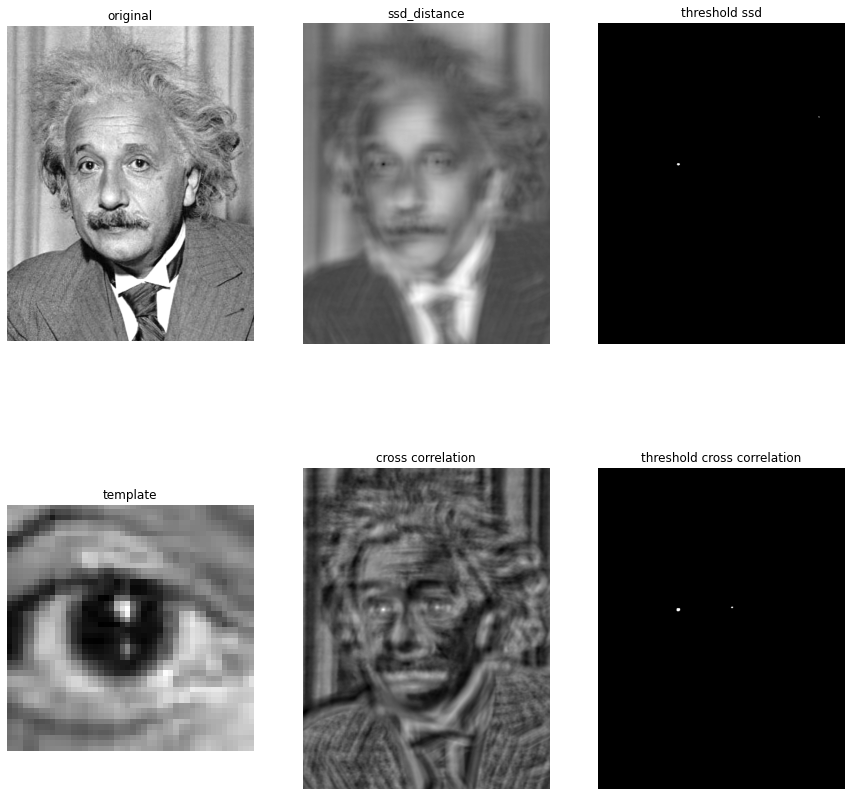

In [14]:
einstein = io.imread('images/einstein_br.png')
eye = io.imread('images/eye.png')

# preprocessing
einstein = rgb2gray(einstein)
eye = rgb2gray(rgba2rgb(eye))
einstein,eye = img_as_float(einstein), img_as_float(eye)

ssd,cross = template_matching(einstein,eye)

Print the minimum SSD and the maximum Normalized Cross-Correlation (NCC)

In [15]:
print(f'Minimum SSD: {ssd.min()}')
print(f'Maximum NCC: {cross.max()}')

Minimum SSD: 3.0698531963845404
Maximum NCC: 0.9768232838639557


**1.3** Read `einstein_mask.png` and display the results on this image, using the `eye.png` template:

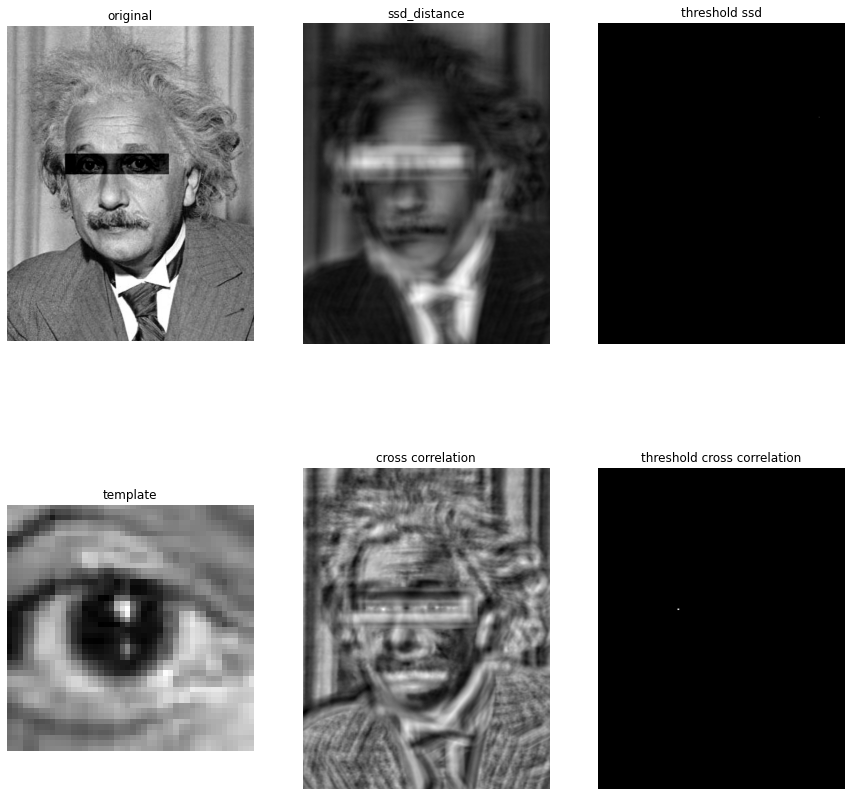

In [16]:
einstein_mask = io.imread('images/einstein_mask.png')
eye = io.imread('images/eye.png')

# preprocessing
einstein_mask = rgb2gray(einstein_mask)
eye = rgb2gray(rgba2rgb(eye))
einstein_mask,eye = img_as_float(einstein_mask), img_as_float(eye)

ssd,cross = template_matching(einstein_mask,eye)

Print the minimum SSD and the maximum NCC

In [17]:
print(f'Minimum SSD: {ssd.min()}')
print(f'Maximum NCC: {cross.max()}')

Minimum SSD: 8.27263708944657
Maximum NCC: 0.6166362739337297


#### What are the distances between the template and the image around the eyes of the image? 

>> Minimum SSD 

Comment the template matching process:
* Is the algorithms affected by contrast changes in the image?
* How do metrics (i.e. minimum euclidean distance and maximum NCC) change in all previous cases? Is there a big difference among these values?
* What parameters it has and which measure for image comparisons works better.

>> Yes, especially when we apply the ssd method

>> The results shows us that there is a significant change in the minimum euclidian distance but the maximum NCC have more or less the same value, with small changes.

>> Each template matching process needs an original image (which we need to find a local part in it), a template image (the patch we want to find in the original image) and the optional threshold value (helps to get the true detections in a binarized result), considering that these parameters have default values. As we have seen in the three cases and possibles input of images, we conclude that is better the normalizad cross correlation, because it is constrast invariant!

**1.4** How does the result of the template matching change if instead the template is the one that changes its contrast (for example if you make it clearer or darker)? To this purpose, use the `eye_br.png` template.

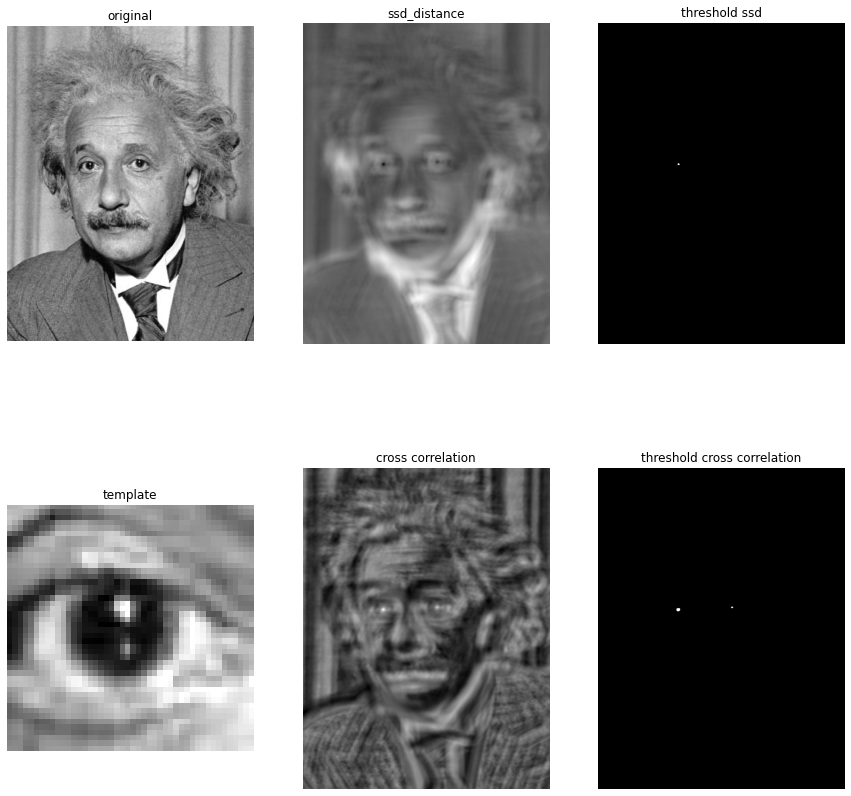

In [18]:
einstein = io.imread('images/einstein.png')
eye = io.imread('images/eye_br.png')

# preprocessing
einstein = rgb2gray(einstein)
eye = rgb2gray(eye)
einstein,eye = img_as_float(einstein), img_as_float(eye)

ssd, cross = template_matching(einstein,eye)

In [19]:
print(f'Minimum SSD: {ssd.min()}')
print(f'Maximum NCC: {cross.max()}')

Minimum SSD: 5.270435388179585
Maximum NCC: 0.9765649754660753


Check how the result changes if the template is rotated.

Visualize the template and its rotation by 2º, 5º, 10º, 15º and 20º. Obtain again the template matching using the Euclidean distance and normalized cross-correlation.

**Help:** use the function rotate() in skimage.transform

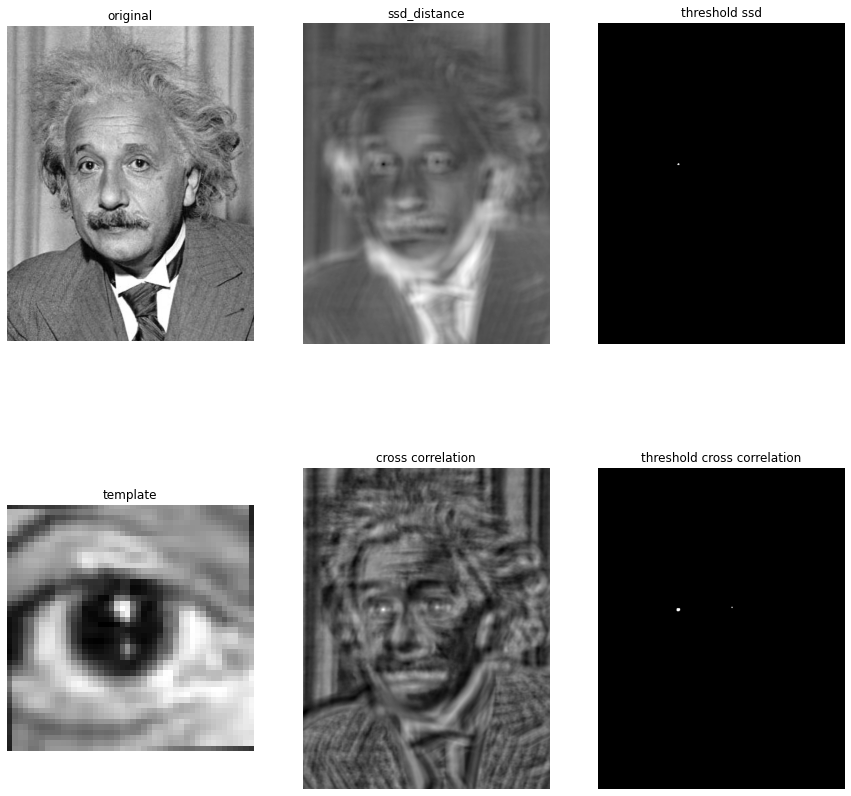

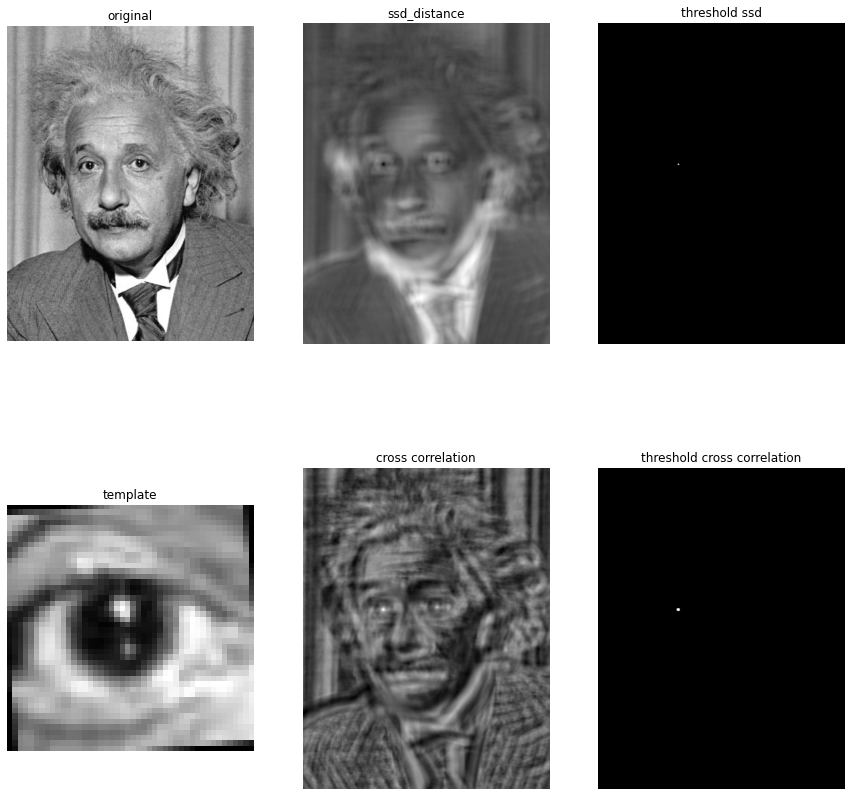

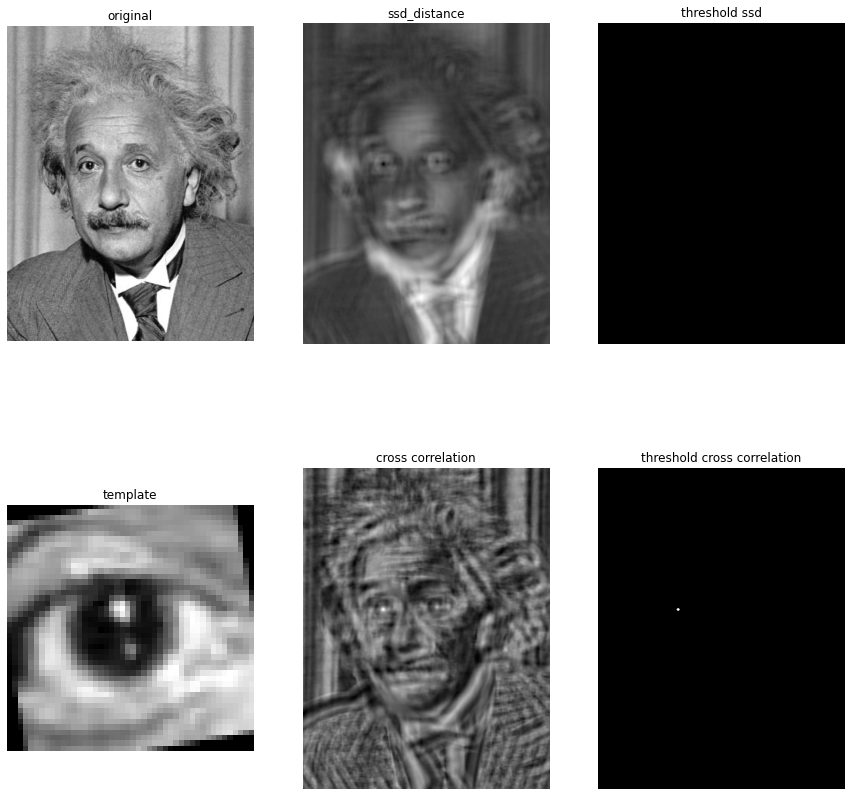

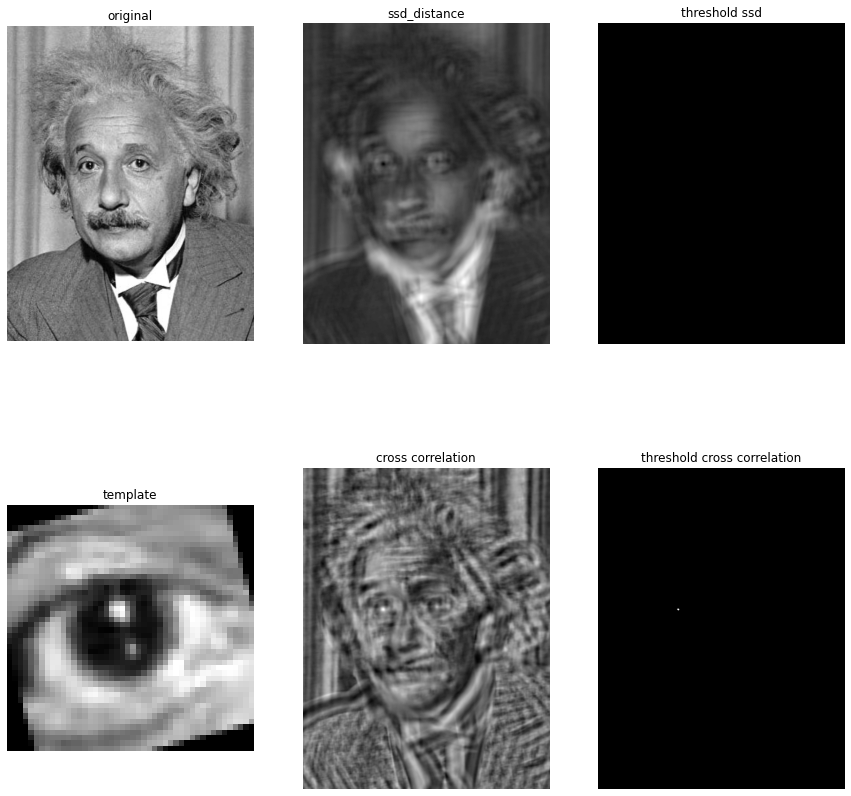

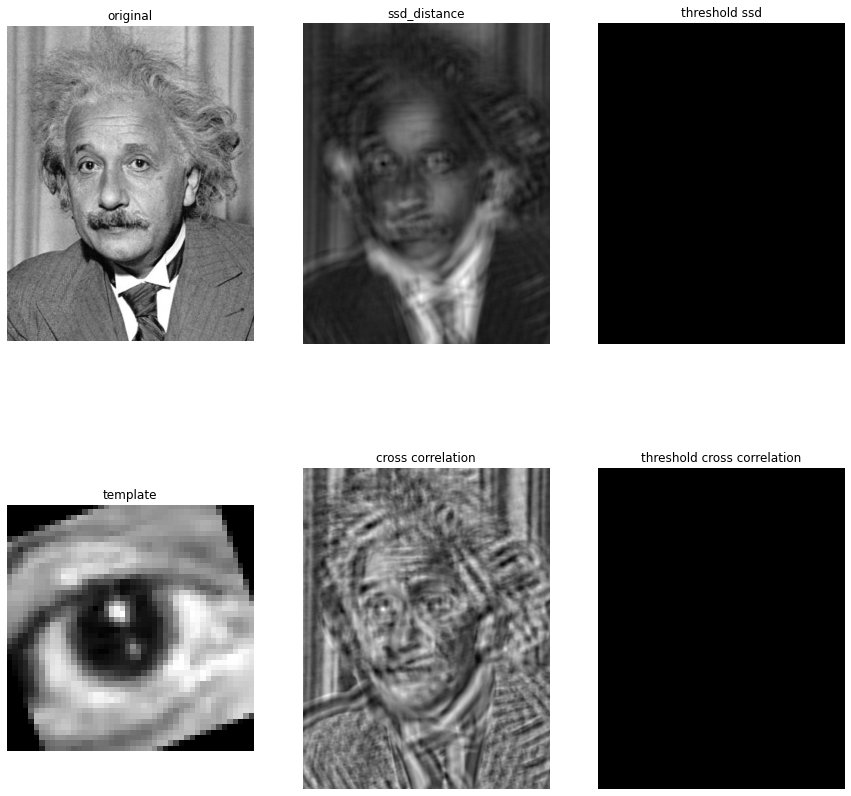

In [20]:
# Define the 5 rotations
eye_2 = rotate(eye, 2)
eye_5 = rotate(eye, 5)
eye_10 = rotate(eye, 10)
eye_15 = rotate(eye, 15)
eye_20 = rotate(eye, 20)

ssd, cross = template_matching(einstein,eye_2)
ssd, cross = template_matching(einstein,eye_5)
ssd, cross = template_matching(einstein,eye_10)
ssd, cross = template_matching(einstein,eye_15)
ssd, cross = template_matching(einstein,eye_20)

Comment the template matching process:
* Please, explain briefly the algorithm, including advantages and disadvantage
* Is the algorithms affected by contrast changes in the tempate image?
* What parameters it has and which measure for image comparisons works better.

>> Sum of Squared Differences (SSD) is an algorithm for image matching and object tracking. The algorithm compares two images by computing the sum of the squared differences between the intensity values of corresponding pixels. The advantage of SSD is that it is simple to implement and computationally efficient, making it well-suited for real-time applications. However, it is sensitive to changes in lighting and can be affected by noise in the images.

>> Normalized Cross-Correlation (NCC) is another algorithm for image matching and object tracking. It calculates the normalized cross-correlation between two images, which is a measure of the similarity between the images. The advantage of NCC is that it is more robust to changes in lighting and noise than SSD. However, it can be more computationally intensive than SSD and may not be as well-suited for real-time applications.

>> The parameters used above are the parameters on which our algorithms works better 

# 2 Histogram of Oriented Gradients

In this section we will treat the following topic: HOG image descriptor. Application to person detection.

The Histogram of Oriented Gradients (HOG) feature descriptor is classical image descriptor for object detection.

Given the image `person_template.bmp` and the folder `/images/TestPersonImages/`, apply the HOG descriptor in order to detect where there is a person in the images. To this purpose, apply the "sliding window" technique. We use images from GRAZ 01 data from [INRIA datasets](http://pascal.inrialpes.fr/data/human/).

**2.1.** Read the template (`person_template.bmp`), obtain its HOG descriptor (with the optimal parameters) and visualize it.

Help: the HOG detector function is in the skimage.feature library ([Help](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html#sphx-glr-auto-examples-features-detection-plot-hog-py)).

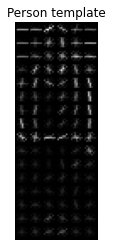

In [21]:
person_template = io.imread('images/person_template.bmp')

person_template = rgb2gray(person_template)
# extract Histogram of Oriented Gradients (HOG) for a given image

# input_image
# orientations = number of orientation bins
# pixels_per_cell = size (in pixels) of a cell
# cells_per_block = number of cells in each block
# visualize = also return an image of the HOG if true
fd, hog_image = hog(person_template, orientations=9, pixels_per_cell=(8, 8),cells_per_block=(2, 2), visualize=True)

# rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

show_img(hog_image,'Person template')

**2.2.** Apply the HOG descriptor on the complete set of images for person detection.

a) Read images from the folder "TestPersonImages", slide a window on each image, obtain the HOG descriptor and compare to the HOG descriptor of the person template. 

b) Visualize the location in the image that is the most similar to the person template using the distance between the template and test image descriptors.

Display the results of every person detection following this format:

<img src="images_notebook/hog.png" width="800" height="100">

In [22]:
# read a sequence of images from a folder
ic = io.ImageCollection('images/TestPersonImages/*.bmp')

In [23]:
def plot_images_with_patch(person,hog_image,rect,rect2):
    
    # plot them all in one line with the rectangle window
    canvas, axs = plt.subplots(nrows=1, ncols=3, figsize= (15,6))
   
    ax = axs[0]
    ax.imshow(person_template, cmap='gray')
    ax.axis('off')
    ax.set_title("Person Template")
    
    ax = axs[1]
    ax.imshow(person, cmap='gray')
    ax.add_patch(rect)
    ax.axis('off')
    ax.set_title("Best Region Match")
    
    ax = axs[2]
    ax.imshow(hog_image, cmap='gray')
    ax.add_patch(rect2)
    ax.axis('off')
    ax.set_title("Hog Distances")
    
    plt.show()

In [24]:
def get_match_and_hog(template_hog,img):
    
    person = rgb2gray(img)
    
    # obtain its hog descriptor
    fd, hog_image = hog(person, orientations=9, pixels_per_cell=(8, 8),cells_per_block=(2, 2), visualize=True) 
    
    # get match
    match = match_template(hog_image, template_hog) 
    
    # get the region that should be highlighted
    ij = np.unravel_index(np.argmax(match), match.shape)
    x, y = ij[::-1]
    
    h, w = person_template.shape
    
    # create these rectangles 
    rect = patches.Rectangle((x, y), w, h, edgecolor='r', facecolor='none')
    rect2 = patches.Rectangle((x, y), w, h, edgecolor='r', facecolor='none')
    
    return hog_image,rect,rect2

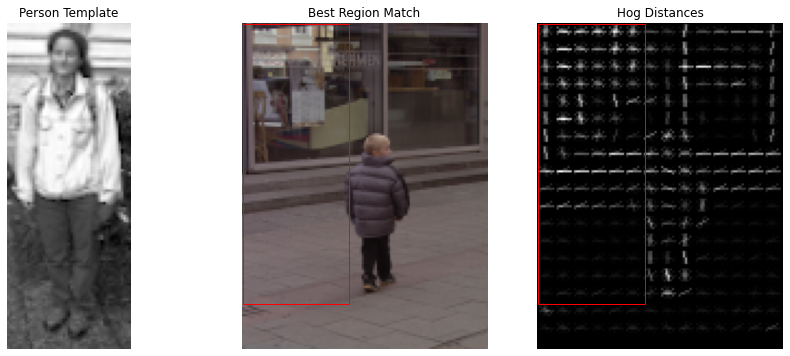

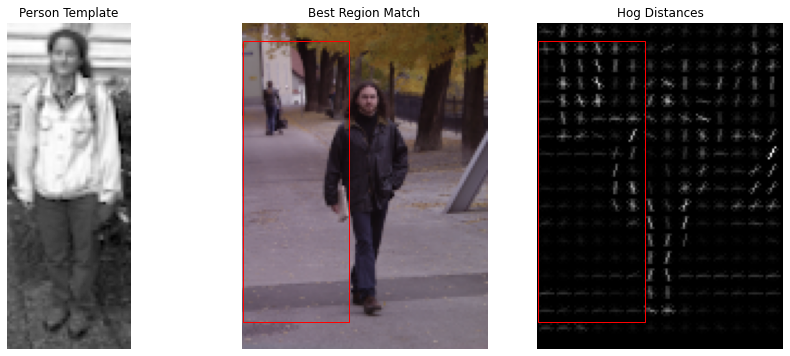

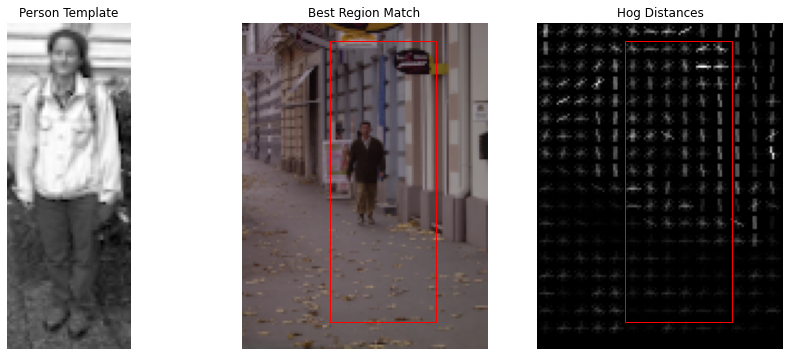

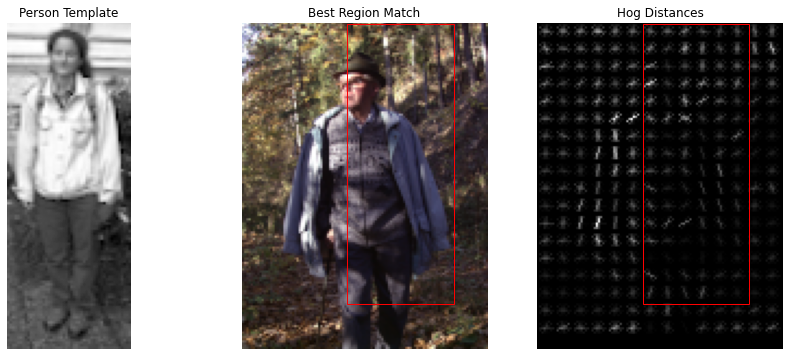

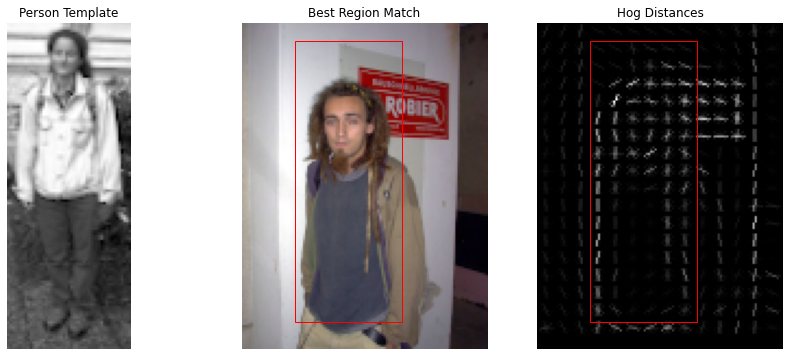

...

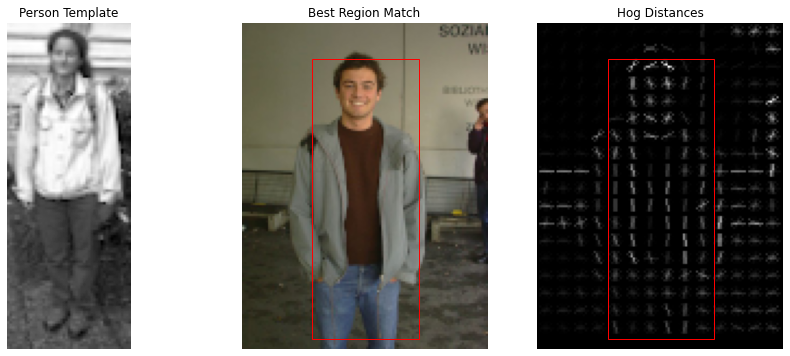

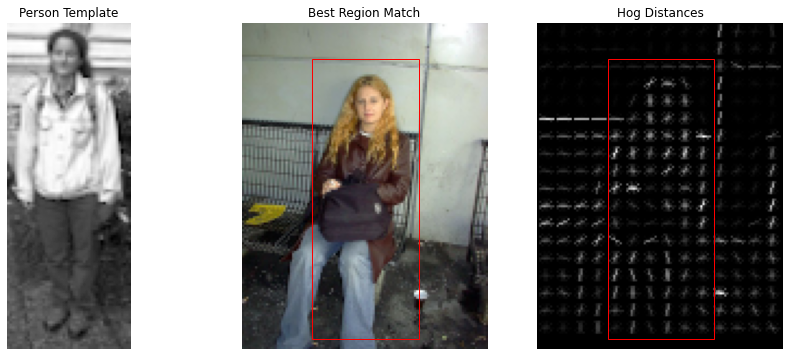

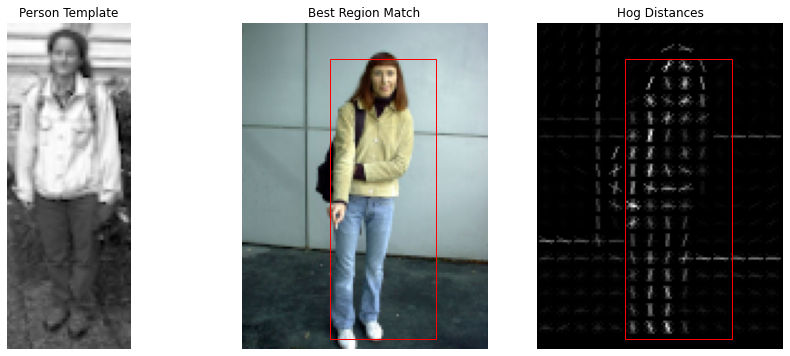

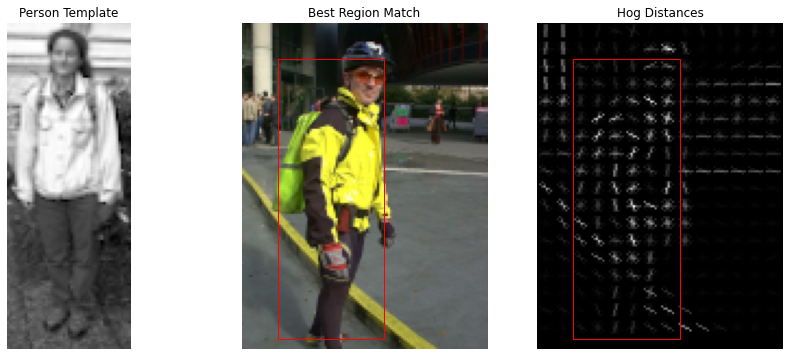

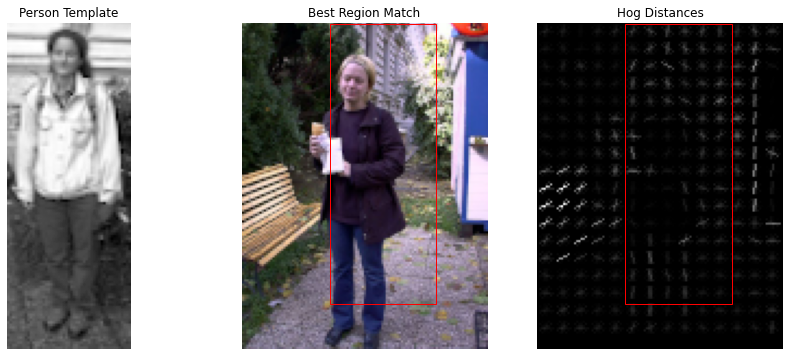

In [25]:
person_template = io.imread('images/person_template.bmp')
person_template = rgb2gray(person_template)

# obtain hog descriptor of the person template
fd, hog_image = hog(person_template, orientations=9, pixels_per_cell=(8, 8),cells_per_block=(2, 2), visualize=True)

for person in ic:
    # get the hog descriptor of each person and plot with the rectangles
    hog_person,rect,rect2 = get_match_and_hog(hog_image,person)
    plot_images_with_patch(person,hog_person,rect,rect2)

What is the dimension of your HOG descriptor? Explain it.

Count on how many images were the persons detected correctly and discuss the failures.
What do you think can be the reasons for the failures?

Test several values of the parameters (``orientations``, ``pixels_per_cell``, ``cells_per_block``) to show which are the optimal values for the person detection problem.

Comment the object detection process:
* Please, explain briefly the algorithm, including advantages and disadvantage
* Do you see any advantages of the HOG-based object detector compared to the template-based object detection? (The answer should be up to 10-15 lines).

# 3 ORB feature detector and binary descriptor

Let us consider the problem of feature extraction that contains two subproblems: 
- feature location, 
- image feature description.

Let us focus on ORB, an approximation of SIFT method, and analyse if ORB is  scale and rotation invariant, a property that is very important for real-time applications.

**Hint:** `ORB` is a function within the module `skimage.feature`
                             
**Help**: We suggest to have a look at the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) how to compute the ORB descriptors and find the descriptors match. You can use the function match_descriptors from `skimage.feature` module in order to compute and show the similar detected descriptors of the given images. 

**3.1** Detect the censure in the image `starbucks4.jpg`. Analyze and discuss the effect of different values of the parameters in censure function.

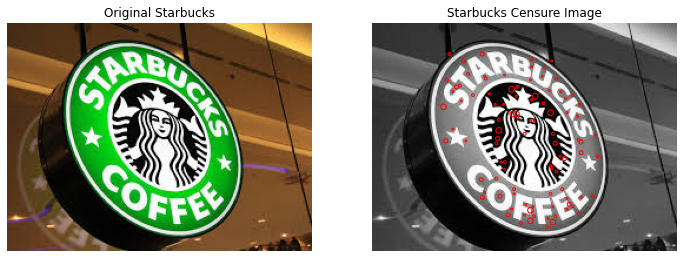

In [26]:
starbucks4 = io.imread('images/starbucks4.jpg')
starbucks4_gray = rgb2gray(starbucks4)

detector = CENSURE()

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

# original image
ax[0].imshow(starbucks4)
ax[0].set_title("Original Starbucks")

detector.detect(starbucks4_gray)

ax[1].imshow(starbucks4_gray, cmap=plt.cm.gray)
ax[1].scatter(detector.keypoints[:, 1], detector.keypoints[:, 0], 2**detector.scales, facecolors='none', edgecolors='r')
ax[1].set_title('Starbucks Censure Image')

for a in ax:
    a.axis('off')

plt.show()

**3.2** Detect the correspondences between the model image `starbucks.jpg` with the scene image `starbucks4.jpg`. You can adapt the code from the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) above. 

Define a function get_ORB implementing the algorithm in order to be able to apply it on different images. Comment the code in detail.

**Hint: If the function plot_matches() gives you an error you can use the plot_matches_aux() at the end of this file.**

Analyze and discuss the effect of different values of the parameter `max_ratio` in the match_descriptors function.


In [27]:
def get_ORB(first, second):
    
    # Oriented FAST and rotated BRIEF feature detector and binary descriptor extractor
    descriptor_extractor = ORB(n_keypoints=200)
    
    # detect the keypoints and compute the descriptors of the model
    descriptor_extractor.detect_and_extract(first)
    keypoints1 = descriptor_extractor.keypoints
    descriptors1 = descriptor_extractor.descriptors
    
    # detect the keypoints and compute the descriptors of the image
    descriptor_extractor.detect_and_extract(second)
    keypoints2 = descriptor_extractor.keypoints
    descriptors2 = descriptor_extractor.descriptors
    
    # get the matches 
    matches12 = match_descriptors(descriptors1, descriptors2, cross_check=True)
    
    # plot results
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (20,10))
    plot_matches(ax, first, second, keypoints1, keypoints2, matches12)
    ax.axis('off')
    ax.set_title("Original Image vs. Transformed Image")
    plt.show()


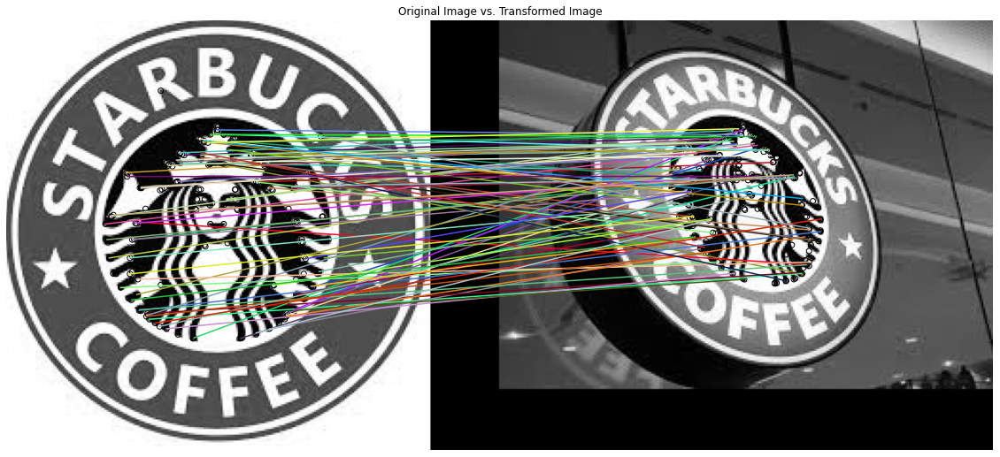

In [28]:
starbucks = io.imread('images/starbucks.jpg')
starbucks_gray = rgb2gray(img_as_float(starbucks))
get_ORB(starbucks_gray, starbucks4_gray)

Repeate the experiment comparing the `starbucks.jpg` image as a model, and showing its matches to all Starbucks images, sorting them based on their similarity to the model. Comment when does the algorithm work better. 

In [29]:
stars = io.ImageCollection('./images/starbucks*')

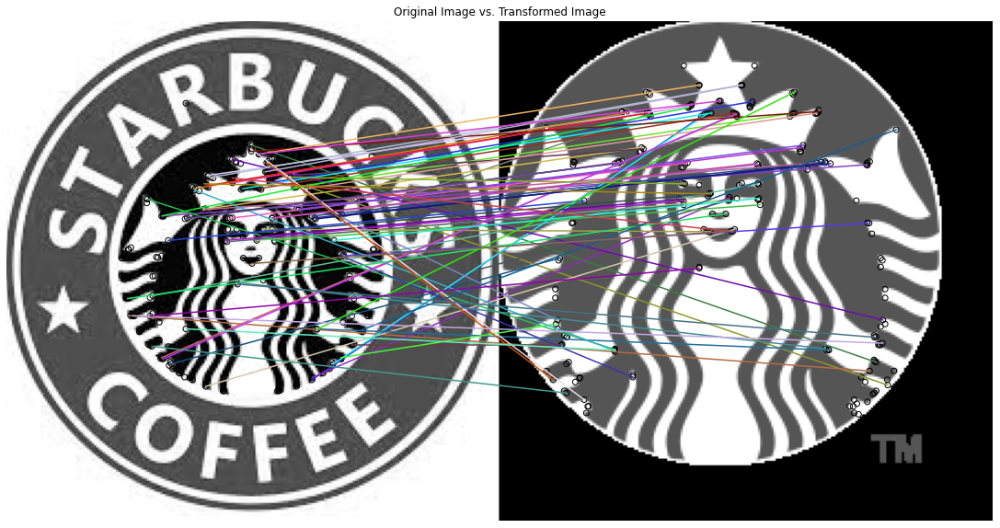

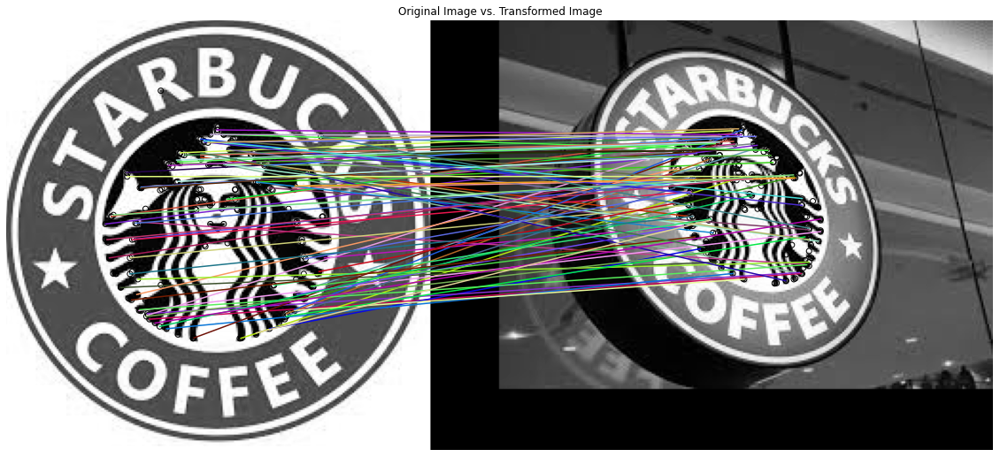

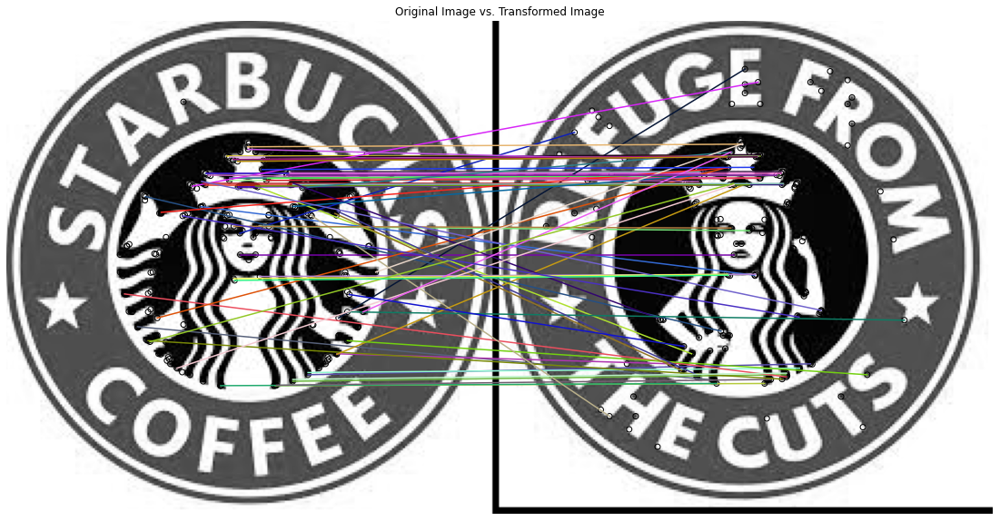

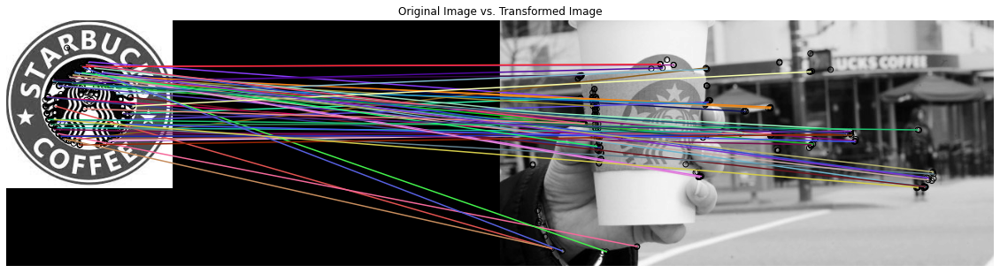

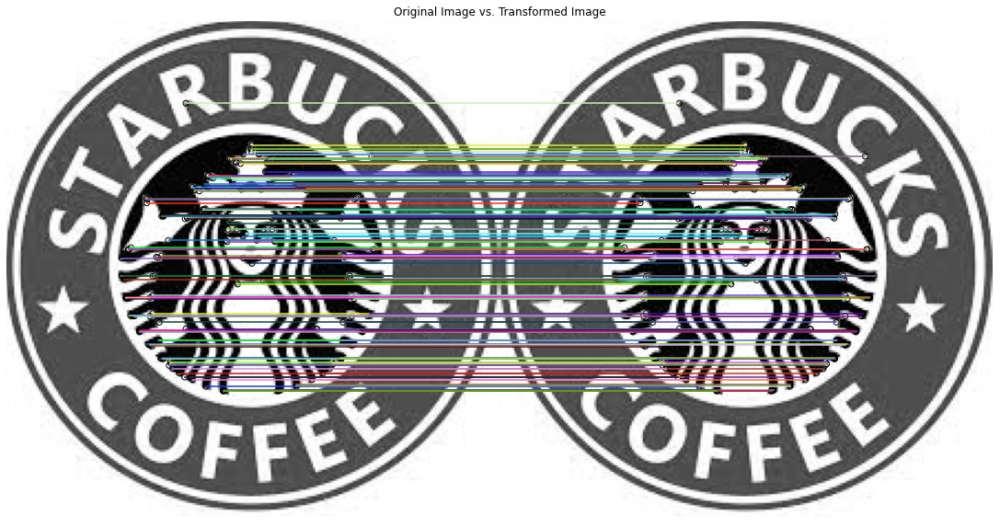

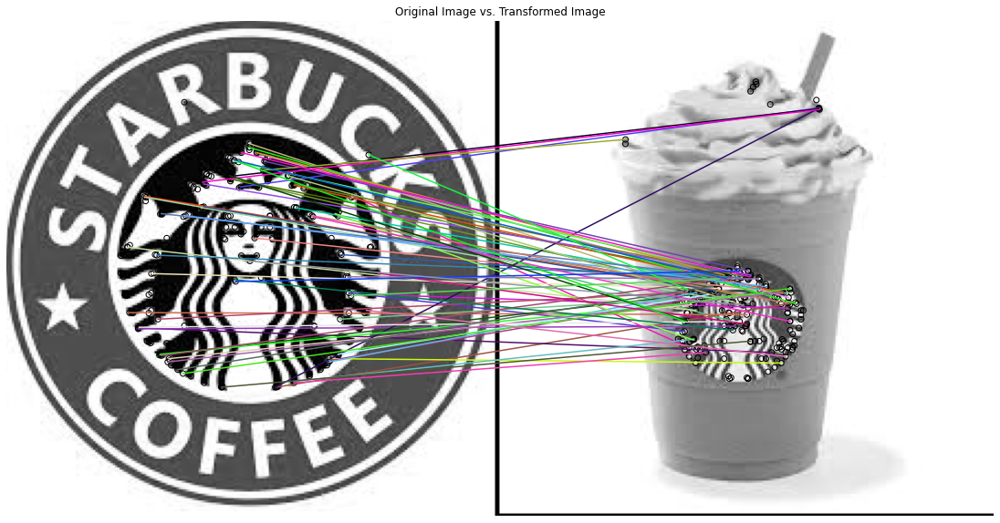

In [30]:
for star in stars:
    # convert to grayscale
    star = rgb2gray(star)
    get_ORB(starbucks_gray, star)

**3.3** Repeate the experiment: 
- Changing the orientation of the model image by rotating it and comparing it with its original version. Help: you can use the rotate() function from skimage.transform 
- Change the scale and orientation of the scene image and compare it with the model image.

**Help:** To do so, you can use the function given below as example:

```
import transform as tf
rotationdegrees = 180
img_rotated = tf.rotate(image2transform, rotationdegrees)
```

or

```
tform = tf.AffineTransform(scale=(1.2, 1.2), translation=(0, -100))
img_transformed = tf.warp(image2transform, tform)
```

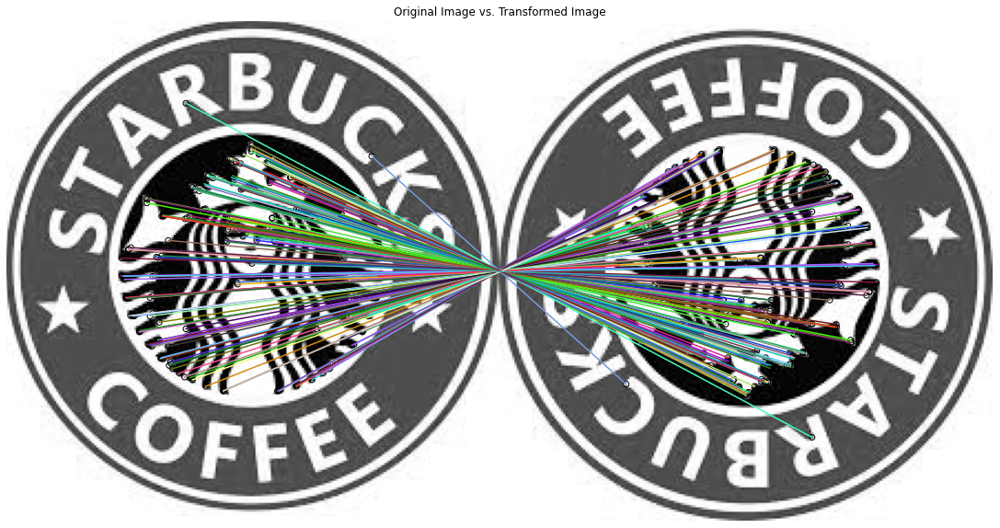

In [33]:
# rotation
rotationdegrees = 180
img_rotated = tf.rotate(starbucks_gray, rotationdegrees)
get_ORB(starbucks_gray, img_rotated)

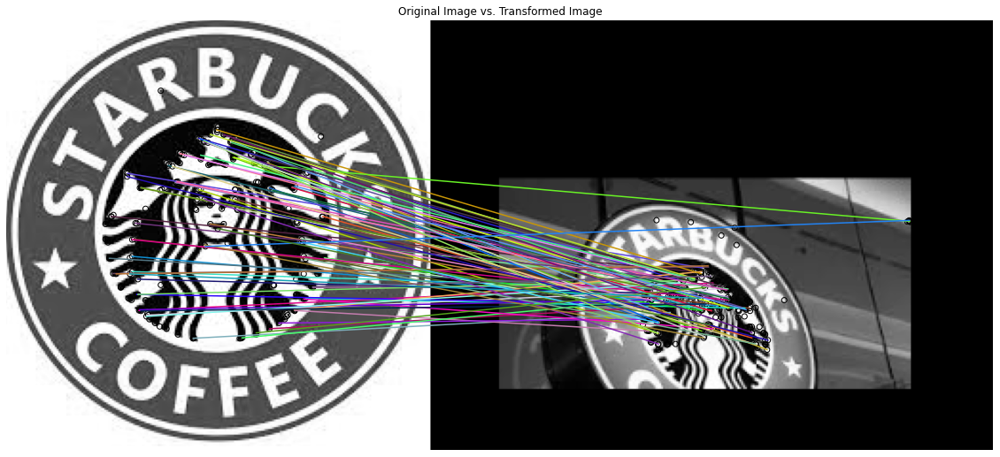

In [36]:
# rescaled and reoriented
tform = tf.AffineTransform(scale=(1.2, 1.2), translation=(0, -100))
img_transformed = tf.warp(starbucks4_gray, tform)
get_ORB(starbucks_gray, img_transformed)

**(Optional)** Repeat the experiment (3.1 to 3.3) with a new group of images. You could use Coca-Cola advertisements or from another famous brand, easily to find on internet.


In [ ]:
# Your solution here

**3.4** Analysis of the applied techniques and results

- What are the advantages of the ORB object detection with respect to the HOG and template object detector?

- What would happen if you analyse an image that does not contain the Starbucks logo? 

- Could you think of ways of defining a quality measure for the correspondance between two images? (no need of implementing it) 

In [ ]:
# Your solution here

### Appendix

In [ ]:
# In case the plot_matches() function gives you some problems, you can use the following one:

from skimage.util import img_as_float
import numpy as np

def plot_matches_aux(ax, image1, image2, keypoints1, keypoints2, matches,
                 keypoints_color='k', matches_color=None, only_matches=False):
    """Plot matched features.
    Parameters
    ----------
    ax : matplotlib.axes.Axes
        Matches and image are drawn in this ax.
    image1 : (N, M [, 3]) array
        First grayscale or color image.
    image2 : (N, M [, 3]) array
        Second grayscale or color image.
    keypoints1 : (K1, 2) array
        First keypoint coordinates as ``(row, col)``.
    keypoints2 : (K2, 2) array
        Second keypoint coordinates as ``(row, col)``.
    matches : (Q, 2) array
        Indices of corresponding matches in first and second set of
        descriptors, where ``matches[:, 0]`` denote the indices in the first
        and ``matches[:, 1]`` the indices in the second set of descriptors.
    keypoints_color : matplotlib color, optional
        Color for keypoint locations.
    matches_color : matplotlib color, optional
        Color for lines which connect keypoint matches. By default the
        color is chosen randomly.
    only_matches : bool, optional
        Whether to only plot matches and not plot the keypoint locations.
    """

    image1 = img_as_float(image1)
    image2 = img_as_float(image2)

    new_shape1 = list(image1.shape)
    new_shape2 = list(image2.shape)

    if image1.shape[0] < image2.shape[0]:
        new_shape1[0] = image2.shape[0]
    elif image1.shape[0] > image2.shape[0]:
        new_shape2[0] = image1.shape[0]

    if image1.shape[1] < image2.shape[1]:
        new_shape1[1] = image2.shape[1]
    elif image1.shape[1] > image2.shape[1]:
        new_shape2[1] = image1.shape[1]

    if new_shape1 != image1.shape:
        new_image1 = np.zeros(new_shape1, dtype=image1.dtype)
        new_image1[:image1.shape[0], :image1.shape[1]] = image1
        image1 = new_image1

    if new_shape2 != image2.shape:
        new_image2 = np.zeros(new_shape2, dtype=image2.dtype)
        new_image2[:image2.shape[0], :image2.shape[1]] = image2
        image2 = new_image2

    image = np.concatenate([image1, image2], axis=1)

    offset = image1.shape

    if not only_matches:
        ax.scatter(keypoints1[:, 1], keypoints1[:, 0],
                   facecolors='none', edgecolors=keypoints_color)
        ax.scatter(keypoints2[:, 1] + offset[1], keypoints2[:, 0],
                   facecolors='none', edgecolors=keypoints_color)

    ax.imshow(image, interpolation='nearest', cmap='gray')
    ax.axis((0, 2 * offset[1], offset[0], 0))

    for i in range(matches.shape[0]):
        idx1 = matches[i, 0]
        idx2 = matches[i, 1]

        if matches_color is None:
            color = np.random.rand(3)
        else:
            color = matches_color

        ax.plot((keypoints1[idx1, 1], keypoints2[idx2, 1] + offset[1]),
                (keypoints1[idx1, 0], keypoints2[idx2, 0]),
                '-', color=color)